[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Zero-Shot Object Detection with Grounding DINO

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/zero-shot-object-detection-with-grounding-dino.ipynb) [![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/IDEA-Research/GroundingDINO) [![arXiv](https://img.shields.io/badge/arXiv-2303.05499-b31b1b.svg)](https://arxiv.org/abs/2303.05499)

Grounding DINO can detect **arbitrary objects** with human inputs such as category names or referring expressions. The key solution of open-set object detection is introducing language to a closed-set detector DINO. for open-set concept generalization. If you want to learn more visit official GitHub [repository](https://github.com/IDEA-Research/GroundingDINO) and read the [paper](https://arxiv.org/abs/2303.05499).

![grounding dino figure](https://media.roboflow.com/notebooks/examples/grounding-dino-figure.png)

## Complementary Materials

---

[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/grounding-dino-zero-shot-object-detection) [![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/cMa77r3YrDk)

We recommend that you follow along in this notebook while reading the blog post on Grounding DINO. We will talk about the advantages of Grounding DINO, analyze the model architecture, and provide real prompt examples.

![grounding dino](https://media.roboflow.com/notebooks/examples/grounding-dino.png)

## ⚠️ Disclaimer

Grounding DINO codebase is still under development. If you experience any problems with launching the notebook, please let us know and create [issues](https://github.com/roboflow/notebooks/issues) on our GitHub.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install Grounding DINO 🦕
- Download Grounding DINO Weights 🏋️
- Download Example Data
- Load Grounding DINO Model
- Grounding DINO Demo
- Grounding DINO with Roboflow Dataset
- 🏆 Congratulations

**Let's begin!**

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Wed Mar 26 06:25:57 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   54C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install Grounding DINO 🦕

In [3]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .
!pip install -q roboflow

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 463, done.
remote: Counting objects: 100% (240/240), done.
remote: Compressing objects: 100% (105/105), done.
remote: Total 463 (delta 175), reused 135 (delta 135), pack-reused 223 (from 1)
Receiving objects: 100% (463/463), 12.87 MiB | 13.37 MiB/s, done.
Resolving deltas: 100% (241/241), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 72.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 72.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━

In [6]:
%%capture
!git clone https://github.com/GFDRR/caribbean-rooftop-classification.git
!pip install segment-geospatial
!pip -q install leafmap huggingface_hub json_fix
%cd caribbean-rooftop-classification

In [16]:

!pip install segment-geospatial

  Using cached segment_geospatial-0.12.4-py2.py3-none-any.whl.metadata (11 kB)
  Using cached fiona-1.10.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (56 kB)
  Using cached ipympl-0.9.7-py3-none-any.whl.metadata (8.7 kB)
  Using cached localtileserver-0.10.6-py3-none-any.whl.metadata (5.2 kB)
  Using cached patool-4.0.0-py2.py3-none-any.whl.metadata (4.5 kB)
  Using cached rioxarray-0.18.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached sam2-1.1.0.tar.gz (152 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.8/73.8 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.

In [12]:
%cd /content/GroundingDINO/caribbean-rooftop-classification

/content/GroundingDINO/caribbean-rooftop-classification


In [13]:
import os
import gdown

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import rasterio as rio
import geopandas as gpd
import leafmap
import torch

from rasterio.plot import show
from shapely.geometry import box
from samgeo import SamGeo

import sys
sys.path.insert(0, "./")
from utils import pred_utils

# Check is GPU is enabled
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device: {}".format(device))
if str(device) == "cuda:0": # Get specific GPU model
  print("GPU: {}".format(torch.cuda.get_device_name(0)))

%load_ext autoreload
%autoreload 2

Device: cuda:0
GPU: Tesla T4


## Download Grounding DINO Weights 🏋️

In [32]:
image_file = "drone.tif"
#@markdown Select mode of download:
mode = 'google_drive'  #@param ["direct_download", "google_drive"]
#@markdown If you chose `direct_download`, specify the URL of the aerial image. Make sure that the file is publicly accessible.
url = "https://oin-hotosm.s3.amazonaws.com/5a95e6312553e6000ce5ad22/0/d3b89c33-ffca-4a2b-8629-ab4e849d968d.tif" #@param {type:"string"}
#@markdown If you chose `google_drive`, specify the Document ID of the file uploaded in Google Drive.
document_id = '1VylcfGaCwcYr5OLYWY_KAGz3sEpiIOZc'  #@param {type:"string"}

# Create output directory
out_dir = './output/'
if not os.path.exists(out_dir):
    os.makedirs(out_dir)
temp_dir = './output/temp/'

# The final building delineation output file
filename = "output.gpkg"
out_file = os.path.join(out_dir, filename)

# Create directory for the drone image
image_dir = "./data/rasters/drone/"
if not os.path.exists(image_dir):
    os.makedirs(image_dir)

if mode == "google_drive":
  url = f"https://drive.google.com/uc?id={document_id}"
  gdown.download(url, image_file, quiet=False)
if mode == "direct_download":
  !wget {url} -O {image_file}

Downloading...
From: https://drive.google.com/uc?id=1VylcfGaCwcYr5OLYWY_KAGz3sEpiIOZc
To: /content/GroundingDINO/caribbean-rooftop-classification/drone.tif
100%|██████████| 18.0M/18.0M [00:00<00:00, 147MB/s]


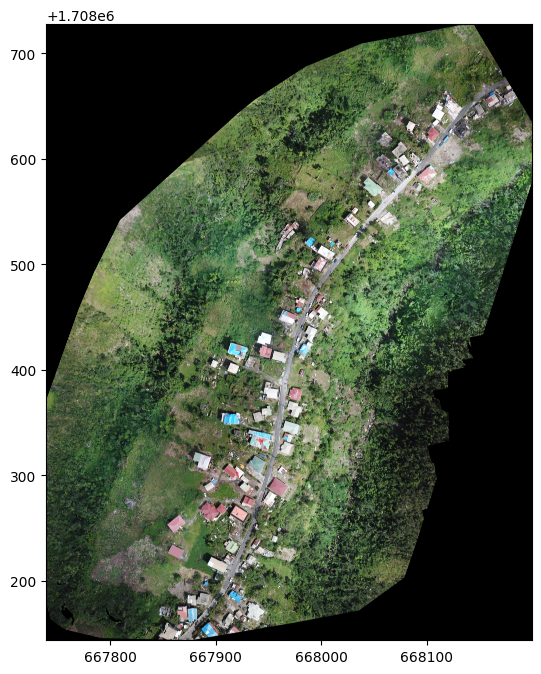

In [33]:
fig, ax = plt.subplots(figsize=(8,8))
image = rio.open(image_file)
show(image, ax=ax);

In [38]:
polygons = pred_utils.segment_image(
    image_file=image_file,
    out_dir=temp_dir,
    out_file=out_file,
    text_prompt="house",
    box_threshold=0.3,
    text_threshold=0.3,
    max_area=1000,
    min_area=5,
    tile_size=10000,
    tolerance=0.0005
);

final text_encoder_type: bert-base-uncased


600000000it [00:00, 161900566134.84it/s]     
100%|██████████| 6/6 [00:59<00:00,  9.99s/it]


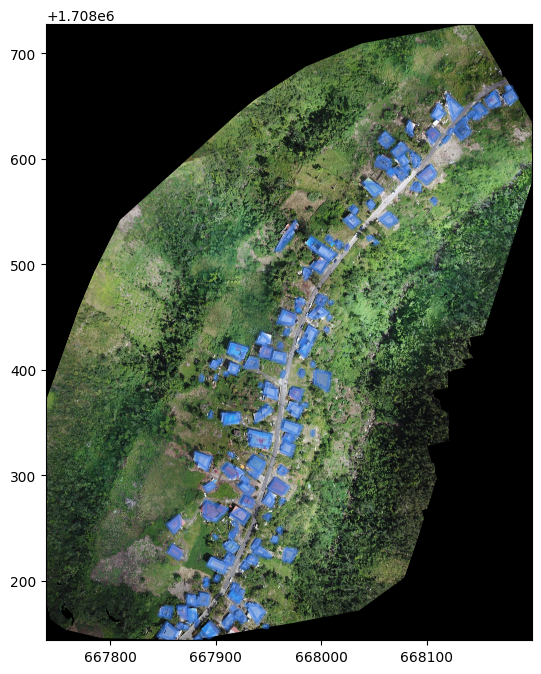

In [41]:
color = "#3476e0"
fig, ax = plt.subplots(figsize=(8,8))
polygons.plot(facecolor=color, edgecolor=color,  linewidth=3, alpha=0.5, ax=ax, aspect=1)
show(image, ax=ax);

In [6]:
import torch
import numpy as np
from PIL import Image
import rasterio as rio
import geopandas as gpd
from tqdm import tqdm
import os
import time
import sys
from rasterio.features import shapes

# Adjust sys.path to include the utils directory
sys.path.insert(0, "/content/GroundingDINO/caribbean-rooftop-classification/utils")
import geoutils
from sam_utils import LangSAM

def get_gpu_memory_usage():
    """Returns current and total GPU memory usage in GB."""
    if torch.cuda.is_available():
        current_memory = torch.cuda.memory_allocated() / 1024**3
        total_memory = torch.cuda.get_device_properties(0).total_memory / 1024**3
        return current_memory, total_memory
    return 0, 0

def save_segmentations(filename, mask_overlay, transform, crs):
    """Saves the segmentation masks overlay as a GeoPackage file."""
    try:
        mask = mask_overlay.astype("int16")
        results = (
            {"properties": {"raster_val": v}, "geometry": s}
            for i, (s, v) in enumerate(shapes(mask, transform=transform))
            if v == 255
        )
        geoms = list(results)
        if len(geoms) > 0:
            gdf = gpd.GeoDataFrame.from_features(geoms)
            gdf.crs = crs
            gdf.to_file(filename, driver="GPKG")
    except Exception as e:
        print(f"Error in save_segmentations: {e}")

def segment_image_gpu_optimized(image_file, out_dir, out_file, text_prompt, tile_size=6000, batch_size=4, box_threshold=0.3, text_threshold=0.3, max_area=1000, min_area=5, tolerance=0.000005):
    start_total = time.time()

    if not os.path.exists(out_dir):
        os.makedirs(out_dir)

    print("Initializing LangSAM with vit_b...")
    model = LangSAM(sam_type="vit_h")
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.groundingdino.to(device)
    model.sam.model.to(device)
    mem_used, mem_total = get_gpu_memory_usage()
    print(f"After model load - GPU Memory: {mem_used:.2f} GB / {mem_total:.2f} GB")

    with rio.open(image_file) as src:
        image_width, image_height = src.width, src.height
        crs = src.crs
    print(f"Image size: {image_width} x {image_height} pixels")

    tiles = geoutils.generate_tiles(image_file, size=tile_size)
    print(f"Total tiles: {len(tiles)}")

    num_batches = (len(tiles) + batch_size - 1) // batch_size
    print(f"Number of batches: {num_batches} (batch_size={batch_size})")

    for batch_idx in tqdm(range(num_batches), desc="Processing batches"):
        start_batch = time.time()
        start_idx = batch_idx * batch_size
        end_idx = min(start_idx + batch_size, len(tiles))
        batch_tiles = tiles.iloc[start_idx:end_idx]
        batch_shapes = [row["geometry"] for _, row in batch_tiles.iterrows()]

        try:
            with rio.open(image_file) as src:
                batch_images, batch_transforms = [], []
                for shape in batch_shapes:
                    out_image, out_transform = rio.mask.mask(src, [shape], crop=True)
                    if (np.mean(out_image) == 255) or (np.mean(out_image) == 0):
                        continue
                    batch_images.append(out_image.transpose((1, 2, 0))[:, :, :3])
                    batch_transforms.append(out_transform)
            mem_used, _ = get_gpu_memory_usage()
            print(f"Batch {batch_idx} - After cropping: GPU Memory: {mem_used:.2f} GB")

            batch_overlays = []
            for image_array in batch_images:
                image_pil = Image.fromarray(image_array)
                masks, boxes, _, _ = model.predict(image_pil, text_prompt, box_threshold, text_threshold)
                mask_overlay = np.zeros((image_pil.size[1], image_pil.size[0]), dtype=np.uint8)
                for i, mask in enumerate(masks):
                    if isinstance(mask, torch.Tensor):
                        mask = mask.cpu().numpy().astype(np.uint8)
                    mask_overlay += ((mask > 0) * (i + 1)).astype(np.uint8)
                mask_overlay = (mask_overlay > 0) * 255
                batch_overlays.append(mask_overlay)
            mem_used, _ = get_gpu_memory_usage()
            print(f"Batch {batch_idx} - After inference: GPU Memory: {mem_used:.2f} GB")

            for idx, (mask_overlay, transform) in enumerate(zip(batch_overlays, batch_transforms)):
                uid = start_idx + idx
                out_file_temp = os.path.join(out_dir, f"{uid}.gpkg")
                save_segmentations(out_file_temp, mask_overlay, transform, crs)

            batch_time = time.time() - start_batch
            mem_used, mem_total = get_gpu_memory_usage()
            print(f"Batch {batch_idx} - Time: {batch_time:.2f}s, Tiles processed: {len(batch_images)}, GPU Memory: {mem_used:.2f} GB / {mem_total:.2f} GB")

        except Exception as e:
            print(f"Batch {batch_idx} failed: {e}")
            continue

    start_merge = time.time()
    try:
        polygons = geoutils.merge_polygons(out_dir, crs, max_area, min_area, tolerance)
        polygons.to_file(out_file, driver="GPKG")
        merge_time = time.time() - start_merge
        print(f"Merging polygons took {merge_time:.2f}s")
    except Exception as e:
        print(f"Merging failed: {e}")

    total_time = time.time() - start_total
    print(f"Total execution time: {total_time:.2f}s ({total_time/60:.2f} minutes)")
    mem_used, mem_total = get_gpu_memory_usage()
    print(f"Final GPU Memory: {mem_used:.2f} GB / {mem_total:.2f} GB")

    return polygons

# Usage
image_file = "/content/GroundingDINO/caribbean-rooftop-classification/image.tif"  # Replace with your actual image path
out_dir = "output_dir"
out_file = "output.gpkg"
text_prompt = "roof"

polygons = segment_image_gpu_optimized(
    image_file=image_file,
    out_dir=out_dir,
    out_file=out_file,
    text_prompt=text_prompt,
    tile_size=9000,
    batch_size=4  # Reduced to prevent memory issues
)

Initializing LangSAM with vit_b...
final text_encoder_type: bert-base-uncased
After model load - GPU Memory: 4.17 GB / 14.74 GB
Image size: 16609 x 12555 pixels


972000000it [00:00, 966081395260.66it/s]     


Total tiles: 12
Number of batches: 3 (batch_size=4)


Processing batches:   0%|          | 0/3 [00:00<?, ?it/s]

Batch 0 - After cropping: GPU Memory: 4.17 GB


Batch 0 - After inference: GPU Memory: 4.17 GB


Processing batches:  33%|███▎      | 1/3 [00:37<01:15, 37.80s/it]

Batch 0 - Time: 37.80s, Tiles processed: 4, GPU Memory: 4.17 GB / 14.74 GB
Batch 1 - After cropping: GPU Memory: 4.17 GB


Batch 1 - After inference: GPU Memory: 4.17 GB


Processing batches:  67%|██████▋   | 2/3 [01:13<00:36, 36.31s/it]

Batch 1 - Time: 35.26s, Tiles processed: 4, GPU Memory: 4.17 GB / 14.74 GB
Batch 2 - After cropping: GPU Memory: 4.17 GB


Batch 2 - After inference: GPU Memory: 4.17 GB


Processing batches: 100%|██████████| 3/3 [01:33<00:00, 31.24s/it]

Batch 2 - Time: 20.65s, Tiles processed: 3, GPU Memory: 4.17 GB / 14.74 GB


Merging polygons took 4.13s
Total execution time: 129.09s (2.15 minutes)
Final GPU Memory: 4.17 GB / 14.74 GB


## Download Example Data

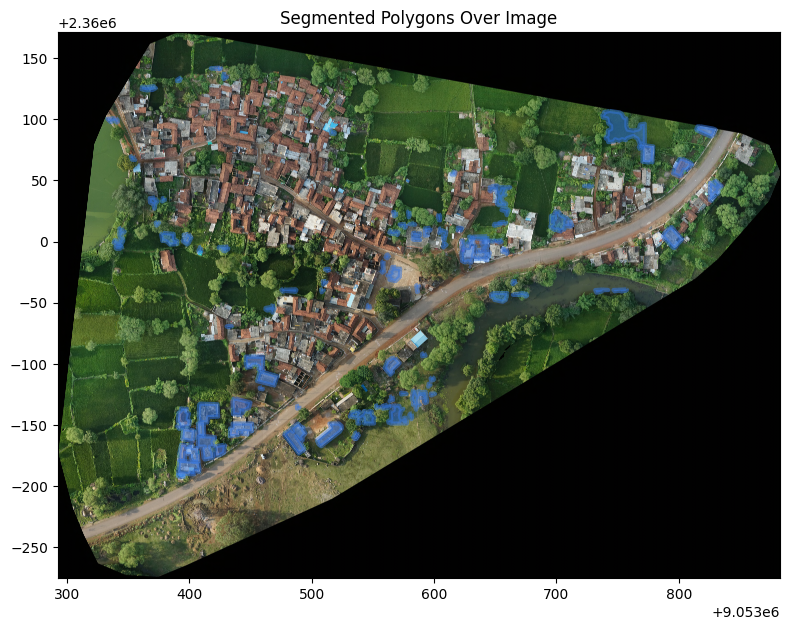

In [7]:
import matplotlib.pyplot as plt
from rasterio.plot import show
import rasterio as rio

# Define the color
color = "#3476e0"  # Blue shade as specified

# Function to plot polygons over the image
def plot_segmentation(image_file, polygons, color="#3476e0"):
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot the polygons with specified color
    polygons.plot(
        facecolor=color,      # Fill color
        edgecolor=color,      # Border color
        linewidth=3,          # Border thickness
        alpha=0.5,            # Transparency
        ax=ax,                # Axis to plot on
        aspect=1              # Equal aspect ratio
    )

    # Open and display the original image
    with rio.open(image_file) as src:
        show(src, ax=ax)  # Overlay image under polygons

    # Optional: Adjust plot settings
    ax.set_title("Segmented Polygons Over Image")
    plt.tight_layout()

    # Show the plot
    plt.show()

# Usage
image_file = "/content/GroundingDINO/caribbean-rooftop-classification/image.tif"  # Replace with your actual image path
out_file = "output.gpkg"               # Path to the output GeoPackage from segmentation

# Load the polygons from the GeoPackage (output of segment_image_gpu_optimized)
polygons = gpd.read_file(out_file)

# Plot the results
plot_segmentation(image_file, polygons, color=color)

## Load Grounding DINO Model

In [40]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!pip install -q localtileserver

In [39]:
data = gpd.GeoDataFrame({"id":1,"geometry":[box(*image.bounds)]}, crs=image.crs).to_crs("EPSG:4326")
centroid = data.geometry.values[0].centroid

map = leafmap.Map(center=[centroid.y, centroid.x], zoom=20)
map.add_raster(image_file, layer_name="Image", zoom=20)
style = {
    "color": "#3388ff",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0.5,
}
map.edit_vector(out_file, layer_name="Vector", style=style)
map

Map(center=[15.4475165, -61.434464500000004], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…